Authors:

Ike Pawsat - pawsat@bc.edu

# Segmenation Algorithm

## Setup

In [ ]:
#imports here
import os
import fnmatch
import shutil
import torch
import torchvision
from torchvision import transforms as transforms
from torchvision import datasets as datasets
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.optim as optim
import random
from torch.nn.utils import spectral_norm

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


## Data Import and Cleaning

In [ ]:
don't recommend running because we already have it done, it will duplicate, so I've added this uncommented at the start from preventing it

dog_data = "/content/drive/MyDrive/animals/train/dog" #just doing dogs for now so just processing dogs
processed_data = "/content/drive/MyDrive/animals/train/dog_processed"  #where processed data should go

if not os.path.exists(processed_data): #create directory if does not exist
    os.makedirs(processed_data)

for filename in os.listdir(dog_data):
    file_path = os.path.join(dog_data, filename)
    if filename.endswith(".jpg"):
        img = Image.open(file_path)
        img = img.convert('L') #grayscale
        img = img.resize((128, 128)) #resize
        img.save(os.path.join(processed_data, filename)) #save to directory

print("Processing complete!")

SyntaxError: invalid syntax (<ipython-input-1-658b42e9a4c0>, line 1)

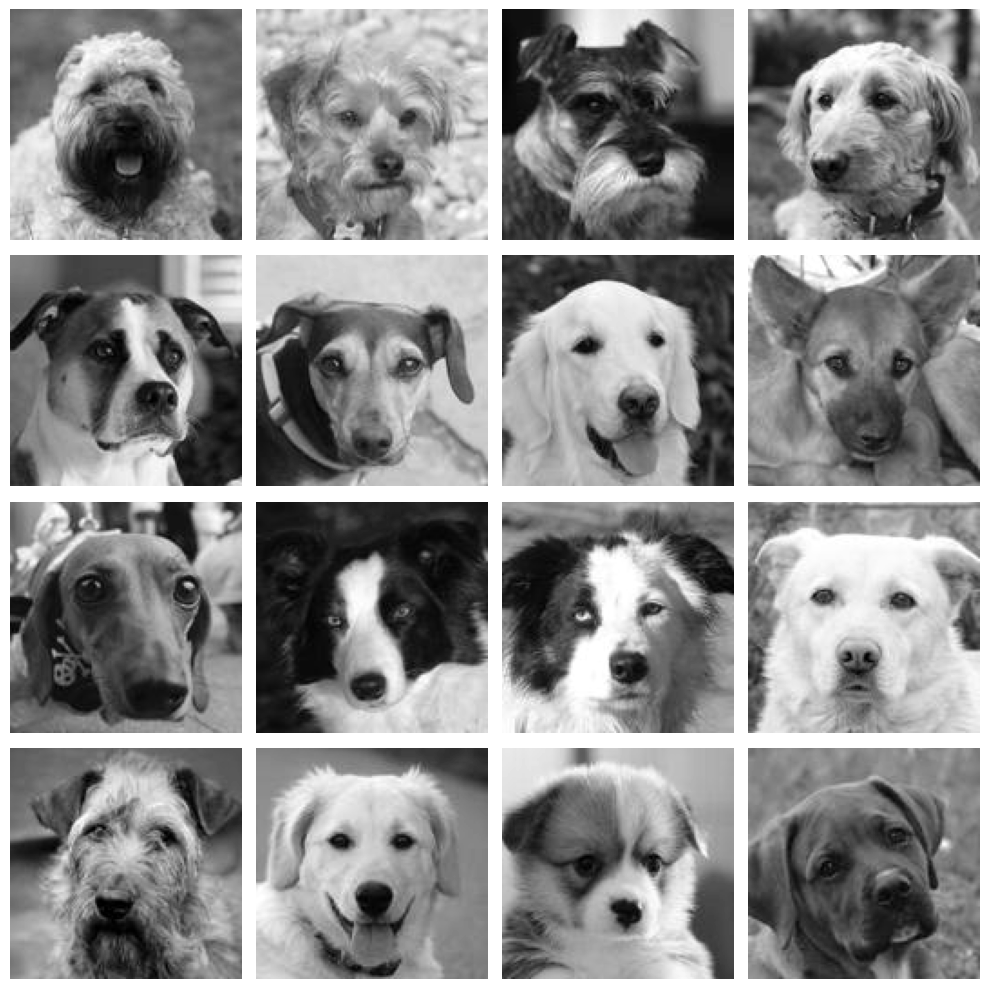

In [ ]:
processed_data = "/content/drive/MyDrive/animals/train/dog_processed"
processed_files = [f for f in os.listdir(processed_data) if f.endswith(".jpg")]
random_files = random.sample(processed_files, 16)  # Pick 16 random files

# Plot the 16 random images
fig, axes = plt.subplots(4, 4, figsize=(10, 10))
axes = axes.flatten()

for i, file in enumerate(random_files):
    img_path = os.path.join(processed_data, file)
    img = Image.open(img_path)
    axes[i].imshow(img, cmap='gray')
    axes[i].axis('off')  # Turn off axis for a cleaner view

plt.tight_layout()
plt.show()

## Model

### Building

In [ ]:
#setup model
class Generator(nn.Module):
  def __init__(self, z_dim, channels_img, features_g):
    super(Generator, self).__init__()
    self.gen = nn.Sequential(
        # Input: X x z_dim x 1 x 1
        self._block(z_dim, features_g * 16, 4, 1, 0), # N x f_g*32 x 4 x 4
        self._block(features_g * 16, features_g * 8, 4, 2, 1), # 8 x 8
        self._block(features_g * 8, features_g * 4, 4, 2, 1), # 16 x 16
        self._block(features_g * 4, features_g * 2, 4, 2, 1), # 32 x 32
        self._block(features_g * 2, features_g, 4, 2, 1), # 64 x 64
        nn.ConvTranspose2d(
            features_g, channels_img, kernel_size=4, stride=2, padding=1,
        ),
        nn.Tanh(), # images are normalized to be within [-1, 1]
    )

  def _block(self, in_channels, out_channels, kernel_size, stride, padding):
    return nn.Sequential(
        nn.ConvTranspose2d(
          in_channels,
          out_channels,
          kernel_size,
          stride,
          padding,
          bias=False,),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(),
    )

  def forward(self, x):
    return self.gen(x)


class Discriminator(nn.Module):
  def __init__(self, channels_img, features_d):
    super(Discriminator, self).__init__()
    self.disc = nn.Sequential(
        # Input image: N x channels_img x 128 x 128
        nn.Conv2d(
            channels_img, features_d, kernel_size=4, stride=2, padding=1
        ), # 64 x 64
        nn.LeakyReLU(0.2),
        self._block(features_d, features_d * 2, 4, 2, 1), # 32 x 32
        self._block(features_d * 2, features_d * 4, 4, 2, 1), # 16 x 16
        self._block(features_d * 4, features_d * 8, 4, 2, 1), # 8 x 8
        self._block(features_d * 8, features_d * 16, 4, 2, 1), # 4 x 4
        nn.Conv2d(features_d * 16, 1, kernel_size=4, stride=2, padding=0), # 1 x 1
            # single value representing if the image if fake or real
        nn.Sigmoid(),
    )

  def _block(self, in_channels, out_channels, kernel_size, stride, padding):
    return nn.Sequential(
        nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size,
            stride,
            padding,
            bias=False,
        ),
        #nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2),
    )

  def forward(self, x):
    return self.disc(x)


def initialize_weights(model):
  for m in model.modules():
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
      nn.init.normal_(m.weight.data, 0.0, 0.02)

def test():
  N, in_channels, H, W = 8, 3, 128, 128
  z_dim = 100
  x = torch.randn((N, in_channels, H , W))
  disc = Discriminator(in_channels, 8)
  initialize_weights(disc)
  assert disc(x).shape == (N, 1, 1, 1)
  gen = Generator(z_dim, in_channels, 8)
  initialize_weights(gen)
  z = torch.randn((N, z_dim, 1, 1))
  print(gen(z).shape)
  print(f"N: {N}, in_channels: {in_channels}, H: {H}, W: {W}")
  assert gen(z).shape == (N, in_channels, H, W)


#test()



### Training

In [ ]:
#training

# hyperparameters, etc.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LEARNING_RATE = 2e-4
BATCH_SIZE = 128
IMAGE_SIZE = 128
CHANNELS_IMG = 1
Z_DIM = 100
NUM_EPOCHS = 100
FEATURES_DISC = 64
FEATURES_GEN = 64

transform = transforms.Compose([
        transforms.Resize(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]
        ),
        transforms.Grayscale(num_output_channels=CHANNELS_IMG),
])
print(transform)

dataset = datasets.ImageFolder(root="/content/drive/MyDrive/animals/train",
                               transform=transform)
loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)
initialize_weights(gen)
initialize_weights(disc)

opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)

run_id = 4  # Increment this each time you start a new training session
writer_real = SummaryWriter(f"runs/run_{run_id}/real")
writer_fake = SummaryWriter(f"runs/run_{run_id}/fake")
writer_gen_loss = SummaryWriter(f"runs/run_{run_id}/gen_loss")
writer_disc_loss = SummaryWriter(f"runs/run_{run_id}/disc_loss")
step = 0

gen.train()
disc.train()

%load_ext tensorboard
%tensorboard --logdir=runs

for epoch in range(NUM_EPOCHS):
  for batch_idx, (real, _) in enumerate(loader):
    real = real.to(device)
    noise = torch.randn((BATCH_SIZE, Z_DIM, 1, 1)).to(device)
    fake = gen(noise)

    # Train discriminator
    disc_real = disc(real).reshape(-1) # N
    loss_disc_real = criterion(disc_real, torch.ones_like(disc_real) * 0.9)
    disc_fake = disc(fake.detach()).reshape(-1)
    loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
    loss_disc = (loss_disc_real + loss_disc_fake) / 2
    disc.zero_grad()
    loss_disc.backward(retain_graph=True)

    opt_disc.step()

    # Train generator
    output = disc(fake).reshape(-1)
    loss_gen = criterion(output, torch.ones_like(output))
    gen.zero_grad()
    loss_gen.backward()
    opt_gen.step()

    # Print losses
    if batch_idx % 100 == 0:
      print(
          f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(loader)} \
          Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}"
      )
      print(loss_disc.item())

      writer_gen_loss.add_scalar("Generator Loss", loss_gen.item(), epoch * len(loader) + step)
      writer_disc_loss.add_scalar("Discriminator Loss", loss_disc.item(), epoch * len(loader) + step)

      with torch.no_grad():
        fake = gen(fixed_noise)
        img_grid_real = torchvision.utils.make_grid(
            real[:32], normalize=True
        )
        img_grid_fake = torchvision.utils.make_grid(
            fake[:32], normalize=True
        )

        writer_real.add_image("Real", img_grid_real, global_step=step)
        writer_fake.add_image("Fake", img_grid_fake, global_step=step)

      step += 1

writer_real.close()
writer_fake.close()


Compose(
    Resize(size=128, interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.5], std=[0.5])
    Grayscale(num_output_channels=1)
)
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 30396), started 0:00:52 ago. (Use '!kill 30396' to kill it.)

<IPython.core.display.Javascript object>

Epoch [0/100] Batch 0/21           Loss D: 0.6883, loss G: 0.9676
Epoch [1/100] Batch 0/21           Loss D: 0.2173, loss G: 1.9852
Epoch [2/100] Batch 0/21           Loss D: 0.1805, loss G: 5.0198
Epoch [3/100] Batch 0/21           Loss D: 0.5020, loss G: 9.7870
Epoch [4/100] Batch 0/21           Loss D: 0.3313, loss G: 11.3740
Epoch [5/100] Batch 0/21           Loss D: 0.2944, loss G: 2.7414
Epoch [6/100] Batch 0/21           Loss D: 0.3772, loss G: 1.7888
Epoch [7/100] Batch 0/21           Loss D: 0.3430, loss G: 2.5794
Epoch [8/100] Batch 0/21           Loss D: 0.4371, loss G: 2.1413
Epoch [9/100] Batch 0/21           Loss D: 0.4441, loss G: 2.3702
Epoch [10/100] Batch 0/21           Loss D: 0.5064, loss G: 2.9063
Epoch [11/100] Batch 0/21           Loss D: 0.5274, loss G: 1.7905
Epoch [12/100] Batch 0/21           Loss D: 0.4261, loss G: 2.3074


### Evaluation

In [ ]:
#evals

## Results

In [ ]:
#results